# **Session 5: Image Segmentation**
This session focuses on the application of image segmentation. It will go through the fundamentals of convolutional neural networks and their operations. We will discuss in detail the use of UNets which apply pixel wise classification for image segmentations. We will train on the Oxford Pet Segmentation data set to segment animals in images.

## Resources

1. https://d2l.ai/chapter_convolutional-neural-networks/index.html


In [1]:
%pip install torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 6.9 MB/s eta 0:00:00


In [2]:
# --- set up our imports for this session ---
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive
import ipywidgets as widgets
import argparse
# --- torch imports ---
import torch
import torch.nn.functional as F
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader

## **Convolution Neural Networks**

Convolution layers differ from fully connected layers as the inputs are 2D grids and the weights are structured in a 3D grid of 2D filters.


### **Size Definitions**
In order to keep track of our dimensions, let us provide the following definitions:
- $L_q = $ length (height) of layer q (rows)
- $B_q = $ breath (width) of layer q (columns).
- $d_q = $ depth (number of channels) of layer q.
  - A channel can be a color for an input or a **feature map** for a hidden layer.
- $d_{q+1} = $ depth of layer $q+1$ which equals the number of filters in the $q$th layer.
- $F_q = $ length and width of a single filter.

### **Filters**
In CNNs the learning parameters are organized into 3D structural units known as filters or kernels. In most cases $L=B$ for layers and **the depth of the filter units always equals the depth of the previous layer**. Usually filter the 2D filter sizes are either 3 or 5.

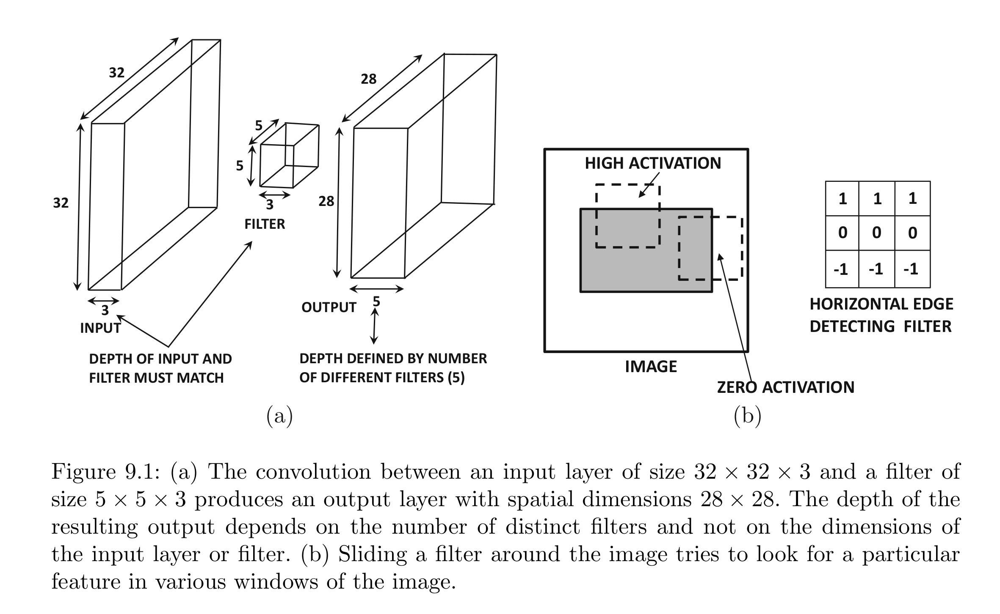

### **Convolutional Operator**
The convolution operator consists of the multi-level summations. The element at the $i$th row, $j$th column, $p$th channel of the next layer is found the following equations:


$h_{ijp}^{(q+1)} = \sum_r^{F_q}\sum_s^{F_q}\sum_k^{d_q} \theta_{rsk}h_{i+r-1, j+s-1, k}^{(q)}$

where:
- $h_{ijp}^{(q+1)} =$ is the element at in the $q+1$ layer.
- $\theta_{rsk} = $ the parameter in the filter to convolve the input with.
- $h_{i+r-1, j+s-1, k}^{(q)} = $ the input element to the operation.
- $∀i \in \{1, ..., L_q - F_q + 1\}$ is the summation over the length of the layer.
- $∀j \in \{1, ..., B_q - F_q + 1\}$ is the summation over the width of the layer.
- $∀k \in \{1, ..., d_{q}\}$ is the summation over depth of the layer.
- $∀p \in \{1, ..., d_{q+1}\}$ for each filter.


The size of the resulting layer size after convolution is then
- $L_{q+1} = (L_q - F_q + 1)$
- $B_{q+1} = (B_q - F_q + 1)$



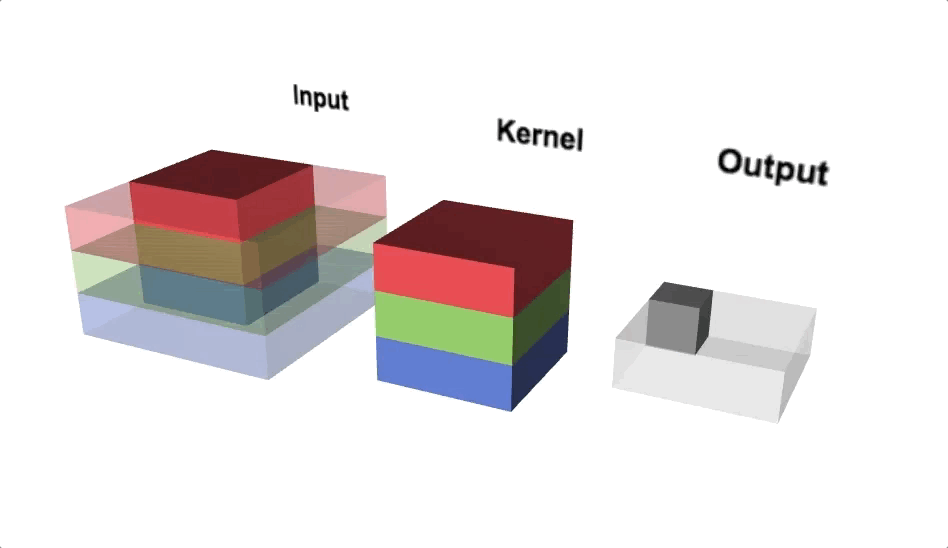

#### **Properties**
- Convolutions are equivariant to translations
  - Shifting pixels will change the feature locations but not the feature values.
- Weights are shared across the elements of a layer, which drastically reduces the number of parameters as compared to fully connected layers.
- A convolution in the $q$th layer increases the receptive field of a feature from the $q$th layer to the $q+1$ layer. Each feature (pixel) of the next layer captures a larger spatial region of the input layer than the last.

### **Padding**
Convolutions will always decrease the spatial dimensions of the feature map in the next layer. This leads to information loss at the borders. Padding the input with zeros can avoid this issue.

#### **Half Padding**
Given a filter dimension of $F_q$, adding $(F_q + 1)/ 2$ features/pixels to the borders with zeros will result in the $q+1$ layer dimensions of $L_q$ and $B_q$. Therefore the spatial dimensions remain the same as in the previous layer, except for the depth which again depends on the number of filters.



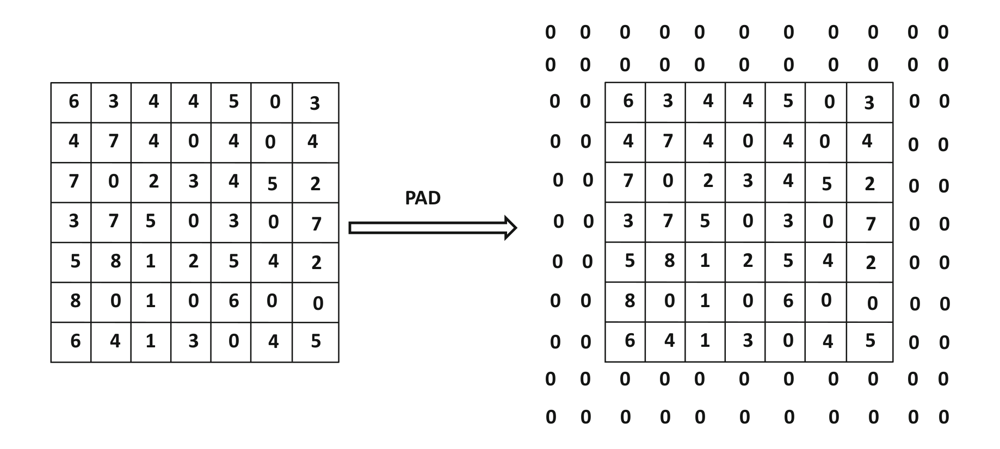

### **Stride**
To reduce the footprint of layers strides greater than one can be used.

When a stride of $S_q$ is used then convolutions are performed at locations $0, S_q, 2*S_q, 3*S_q, ...$. The resulting output size of the next layer will be:
- $L_{q+1} = (L_q - F_q)/ S_q + 1$
- $B_{q+1} = (B_q - F_q)/ S_q + 1$

The larger the stride the larger the receptive field will be in the next layer. Increasing the stride can also help reduce memory usage and reduce the likelihood of overfitting.

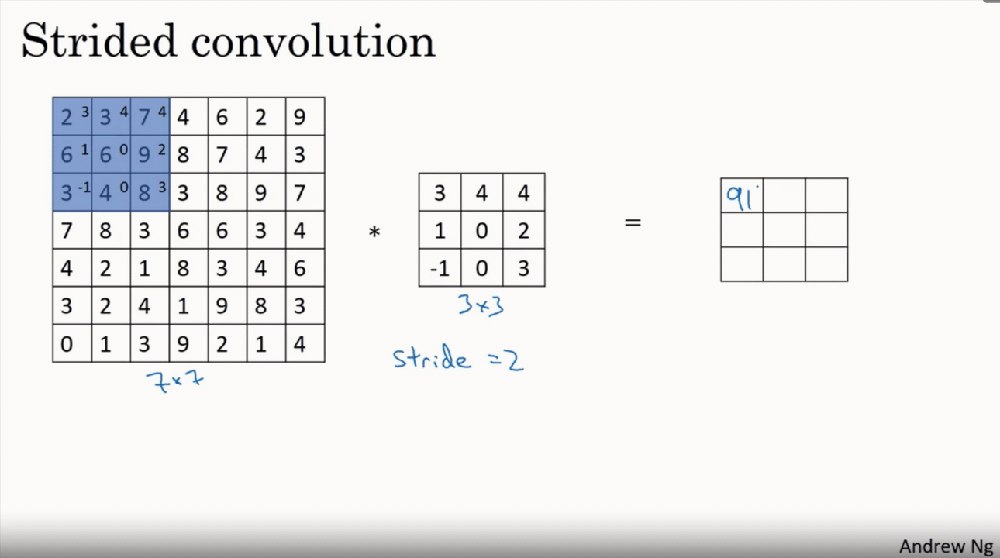

### **Pooling**

Pooling is an operation on small grid regions of size $(P_q \times P_q)$ in each layer, and produces another layer with the same depth (therefore retains the same number of feature maps).

Pooling drastically reduces spatial dimensions of the feature maps and increases the receptive field.

- *See: https://theaisummer.com/receptive-field/*

#### **Max-Pooling**

In each square region $(P_q \times P_q)$ in each of the $d_q$ activation maps, the maximum of these values is returned. Max-pooling is translation invariant.

Max-pooling produces a new layer with depth $d_{q+1} = d_q$ and for stride $S_q$:
- $L_{q+1} = (L_q - P_q)/S_q + 1$
- $B_{q+1} = (B_q - P_q)/S_q + 1$

It is common to use $S_q = P_q$ such that there no $(P_q \times P_q)$ regions that overlap.

#### **Average Pooling**

Average pooling is less common than max-pooling and it takes the average value of the $(P_q \times P_q)$ region rather than the max. Average pooling is **not** translation invariant.

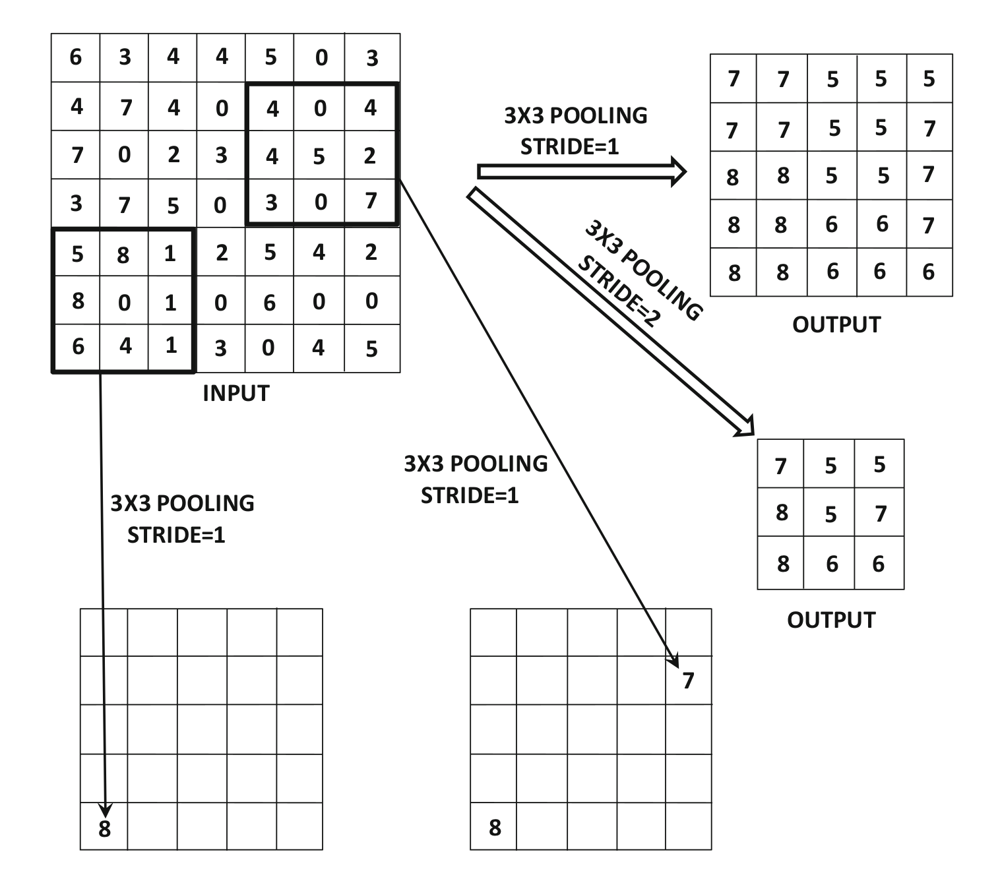


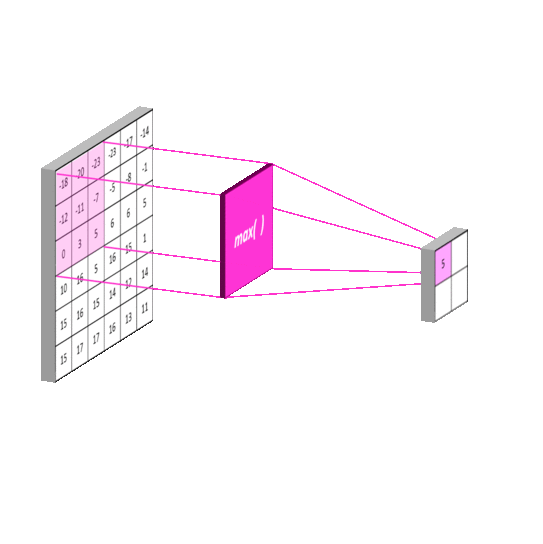

## **Image Segmentation of Pets**

The main application of this session is building a UNet capable of per-pixel segmentation of animals.

### **Data**

The data labels consists of three classes
- Pet
- Background
- Border

**Every pixel will have one of these three labels for every image.**


### **Dataset**

We will use the Oxford Pet Segmentation dataset with data augmentation routines.

In [3]:
# --- general imports ---
from typing import Tuple
import matplotlib.pyplot as plt
import os
import numpy as np
# --- torch import ---
import torch
from torchvision.datasets.oxford_iiit_pet import OxfordIIITPet
import torchvision.transforms as T
from torch.utils.data import DataLoader, SubsetRandomSampler
import torchmetrics as TM
import torchvision


class OxfordIIITPetsAugmented(OxfordIIITPet):
    """
    TrimapClasses
        PET = 0
        BACKGROUND = 1
        BORDER = 2
    """
    def __init__(
            self,
            root: str,
            split: str,
            target_types="segmentation",
            download=False,
            pre_transform=None,
            post_transform=None,
            pre_target_transform=None,
            post_target_transform=None,
            common_transform=None,
    ):
        super().__init__(
            root=root,
            split=split,
            target_types=target_types,
            download=download,
            transform=pre_transform,
            target_transform=pre_target_transform,
        )
        self.post_transform = post_transform
        self.post_target_transform = post_target_transform
        self.common_transform = common_transform

    def __len__(self):
        return super().__len__()

    def __getitem__(self, idx):
        (input_item, target) = super().__getitem__(idx)

        # Common transforms are performed on both the input and the labels
        # by creating a 4 channel image and running the transform on both.
        # Then the segmentation mask (4th channel) is separated out.
        if self.common_transform is not None:
            both = torch.cat([input_item, target], dim=0)
            both = self.common_transform(both)
            (input_item, target) = torch.split(both, 3, dim=0)
        # end if

        if self.post_transform is not None:
            input_item = self.post_transform(input_item)
        if self.post_target_transform is not None:
            target = self.post_target_transform(target)

        return input_item, target



### **Model**
For image segmentation we will be using a Unet. This is a common architecture in the use for pixel-wise classification.

**Original Proposal:** https://arxiv.org/abs/1505.04597


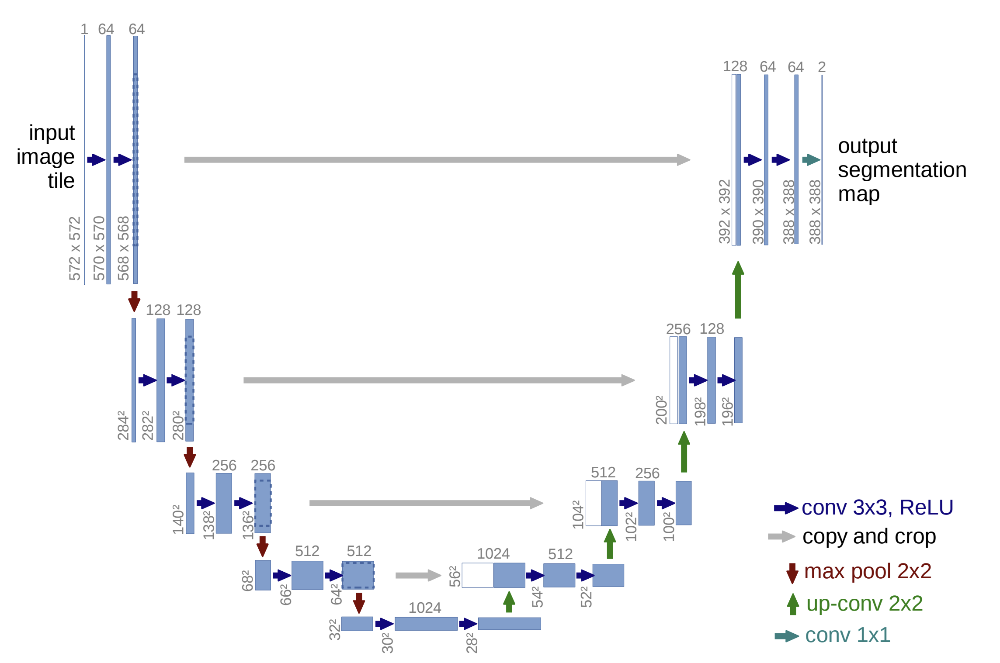

The fundamental unit in the Unet architecture is two sequential convolutional layers of the same size.

In [4]:
# --- torch import ---
import torch
from torch import nn
import torch.nn.functional as F

class DoubleConv(nn.Module):

    def __init__(self, depth, num_filters, kernel_size, stride, padding):
        super().__init__()

        # --- parameters ---
        self.depth = depth
        self.num_filters = num_filters
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

        # --- layers ---
        self.conv_1 = nn.Conv2d(self.depth, self.num_filters, self.kernel_size, self.stride, padding=self.padding)
        self.batch_norm_1 = nn.BatchNorm2d(self.num_filters)
        self.conv_2 = nn.Conv2d(self.num_filters, self.num_filters, self.kernel_size, self.stride, padding=self.padding)
        self.batch_norm_2 = nn.BatchNorm2d(self.num_filters)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        # --- convolutions ---
        x = self.conv_1(inputs)
        x = self.batch_norm_1(x).relu()
        x = self.conv_2(x)
        return self.batch_norm_2(x).relu()


Utilizing the ***DoubleConv*** class we can now create an encoder and decoding layers. The encoder layer consists of a double convolution operation, a max-pooling operation and drop out operation. The output of the double convolution operator is returned to use for residual learning via skip connections.

In [5]:
class UNetEncoderLayer(torch.nn.Module):

    def __init__(self, depth, num_filters, kernel_size, stride, dropout=0.3):
        super().__init__()

        # --- parameters ---
        self.depth = depth
        self.num_filters = num_filters
        self.kernel_size = kernel_size
        self.stride = stride

        # --- core layers ---
        self.double_conv = DoubleConv(self.depth, self.num_filters, self.kernel_size, stride, 1)

        # --- output layers ---
        self.max_pool = nn.MaxPool2d(2, 2)
        self.dropout = nn.Dropout(dropout)

    def forward(self, inputs: torch.Tensor) -> [torch.Tensor, torch.Tensor]:
        # --- convolutions ---
        output = self.double_conv(inputs)

        # --- output block ---
        x = self.max_pool(output)
        x = self.dropout(x)

        return x, output

The decoder layer combines the double convolution with up sampling convolution, the inputs from the skip connections, and drop out operations.

In [6]:
class UNetDecoderLayer(torch.nn.Module):

    def __init__(self, depth, num_filters, kernel_size, stride, dropout=0.3):
        super().__init__()

        # --- parameters ---
        self.depth = depth
        self.num_filters = num_filters
        self.kernel_size = kernel_size
        self.stride = stride

        # --- input layers ---
        self.up_sample = nn.ConvTranspose2d(self.depth, self.num_filters, 2, 2)
        self.dropout = nn.Dropout(dropout)

        # --- core layers ---
        self.double_conv = DoubleConv(2 * self.num_filters, self.num_filters, self.kernel_size, self.stride, 1)

    def forward(self, inputs: torch.Tensor, residual: torch.Tensor) -> torch.Tensor:
        # --- up sample ---
        x = self.up_sample(inputs)
        x = torch.cat([x, residual], dim=-3)
        x = self.dropout(x)

        # --- convolutions ---
        out = self.double_conv(x)

        return out


Finally the UNet can be created by combining the repeated use of encoding layers, a bottle neck operation and repeated use of decoding layers. The final output layer contains a convolutional layer that has the same number of filters as the number of classes and has a kernel size of 1 to retain the original image size.

In [7]:

class UNet(torch.nn.Module):

    def __init__(self, input_args):
        super().__init__()

        # --- set the dimensions ---
        self.input_size = input_args.input_size
        self.input_depth = input_args.input_depth
        self.output_size = input_args.output_size
        self.channel_index = -3

        # --- set up the encoder ---
        self.encode_1 = UNetEncoderLayer(self.input_depth, 64, 3, 1)
        self.encode_2 = UNetEncoderLayer(64, 128, 3, 1)
        self.encode_3 = UNetEncoderLayer(128, 256, 3, 1)
        self.encode_4 = UNetEncoderLayer(256, 512, 3, 1)

        # --- set up the bottleneck ---
        self.bottleneck = DoubleConv(512, 1024, 3, 1, 1)

        # --- set up the decoder ---
        self.decode_1 = UNetDecoderLayer(1024, 512, 3, 1)
        self.decode_2 = UNetDecoderLayer(512, 256, 3, 1)
        self.decode_3 = UNetDecoderLayer(256, 128, 3, 1)
        self.decode_4 = UNetDecoderLayer(128, 64, 3, 1)

        # --- output layers ---
        self.output_layer = nn.Conv2d(64, self.output_size, 1)

    def forward(self, inputs: torch.Tensor) -> torch.Tensor:
        # --- encode ---
        x, residual_1 = self.encode_1(inputs)
        x, residual_2 = self.encode_2(x)
        x, residual_3 = self.encode_3(x)
        x, residual_4 = self.encode_4(x)

        # --- bottleneck ---
        x = self.bottleneck(x)

        # --- decode ---
        x = self.decode_1(x, residual_4)
        x = self.decode_2(x, residual_3)
        x = self.decode_3(x, residual_2)
        x = self.decode_4(x, residual_1)

        # --- output ---
        x = self.output_layer(x)

        return F.log_softmax(x, dim=1)

### **Trainer**
The trainer is responsible for all dataset handling and training functionality.

In [8]:
# --- general imports ---
from typing import Callable
import numpy as np
# --- torch imports ---
import torch


class EarlyStopping:
    """
    A class to allow monitoring of model's validation accuracy during training.

    Notes:
        Early stopping during training is one technique to prevent over-fitting of a model.
    """

    def __init__(self,
                 patience: int,
                 checkpoint_path: str,
                 minimum_improvement: float = 0.0,
                 verbose: bool = False,
                 trace_function: Callable = print):
        """
        Args:
            patience: The number of iterations to wait for improvement before early stopping.
            checkpoint_path: The path in which to save the model state.
            minimum_improvement: The minimum change in monitored quantity to qualify as an improvement.
            verbose: Whether to log the improvements for each checkpoint.
            trace_function: Logging function.
        """
        # ---  set the properties ---
        self.patience = patience
        self.checkpoint_path = checkpoint_path
        self.minimum_improvement = minimum_improvement
        self.verbose = verbose
        self.trace_function = trace_function

        # --- initialize the tracking quantities ---
        self.counter = 0
        self.best_score = None
        self.validation_loss_minimum = np.Inf
        self.stop = False

    def __call__(self, model: torch.nn.Module, validation_loss: float):

        if self.best_score is None:
            self.best_score = validation_loss
            self.save_checkpoint(model, validation_loss)
        elif validation_loss > self.best_score - self.minimum_improvement:
            self.counter += 1
            if self.verbose:
                self.trace_function(f"Early Stopping Counter: {self.counter} / {self.patience}")
            if self.counter >= self.patience:
                self.stop = True
        else:
            self.best_score = validation_loss
            self.save_checkpoint(model, validation_loss)
            self.counter = 0

    def save_checkpoint(self, model: torch.nn.Module, validation_loss: float):
        """Saves the Model.

        Args:
            model: The model to save
            validation_loss: The loss of the validation dataset.
        """
        if self.verbose:
            self.trace_function(f"Validation loss: {self.validation_loss_minimum} to {validation_loss}")
        torch.save(model.state_dict(), self.checkpoint_path)
        self.validation_loss_minimum = validation_loss


Now lets create a trainer class. It needs to be able to load in the datasets for training and testing. It will use a training function and testing function.

In [9]:
class Trainer:

    def __init__(self, input_args):
        # --- parameters ---
        self.input_args = input_args
        self.device = self._acquire_device()
        self.input_size = args.input_size
        self.train_loader, self.validation_loader, self.test_loader = self.create_datasets()


        # --- set up model paths ---
        self.model_check_point_path = self.input_args.model_path + "/model_checkpoint.pt"
        self.final_model_path = self.input_args.model_path + "/final_model.pt"

        # --- set up early stopping ---
        self.early_stopping = None
        if self.input_args.use_early_stopping:
            self.early_stopping = EarlyStopping(self.input_args.es_patience, self.model_check_point_path)

    def _acquire_device(self):
        if self.input_args.use_gpu:
            os.environ["CUDA_VISIBLE_DEVICES"] = str(
                self.input_args.gpu) if not self.input_args.use_multi_gpu else self.input_args.devices
            device = torch.device('cuda:{}'.format(self.input_args.gpu))
            print('Use GPU: cuda:{}'.format(self.input_args.gpu))
        else:
            device = torch.device('cpu')
            print('Use CPU')
        return device

    def create_datasets(self) -> Tuple[DataLoader, DataLoader, DataLoader]:
        # Create a tensor for a segmentation trimap.
        # Input: Float tensor with values in [0.0 .. 1.0]
        # Output: Long tensor with values in {0, 1, 2}
        def tensor_trimap(t):
            x = t * 255
            x = x.to(torch.long)
            x = x - 1
            return x

        def args_to_dict(**kwargs):
            return kwargs

        # --- set up transformations ---
        transform_dict = args_to_dict(
            pre_transform=T.ToTensor(),
            pre_target_transform=T.ToTensor(),
            common_transform=T.Compose([
                lambda x: x.to(self.device),
                T.Resize((self.input_size, self.input_size), interpolation=T.InterpolationMode.NEAREST),
                # Random Horizontal Flip as data augmentation.
                T.RandomHorizontalFlip(p=0.5),
            ]),
            post_transform=T.Compose([
                # Color Jitter as data augmentation.
                T.ColorJitter(contrast=0.3),
            ]),
            post_target_transform=T.Compose([
                T.Lambda(tensor_trimap),
            ]),
        )

        # --- create training data ---
        train_data = OxfordIIITPetsAugmented(self.input_args.dataset_path, "trainval", target_types="segmentation",
                                                download=True, **transform_dict)

        # --- create test data ---
        test_data = OxfordIIITPetsAugmented(self.input_args.dataset_path, "test", target_types="segmentation",
                                               download=True, **transform_dict)

        # --- create train/validation/test datasets ---
        training_size = len(train_data)
        indices = np.arange(training_size)
        # --- shuffle indices in place ---
        for _ in range(1000):
            np.random.shuffle(indices)

        # --- split index ---
        training_split = int(np.floor(training_size * self.input_args.validation_percent))
        train_idx, validation_idx = indices[training_split:], indices[:training_split]

        # --- samplers for batching ---
        train_sampler = SubsetRandomSampler(train_idx)
        validation_sampler = SubsetRandomSampler(validation_idx)

        # --- data loaders ---
        train_loader = DataLoader(train_data,
                                  batch_size=self.input_args.batch_size,
                                  sampler=train_sampler,
                                  num_workers=0 if self.input_args.use_gpu else 10)
        validation_loader = DataLoader(train_data,
                                       batch_size=self.input_args.batch_size,
                                       sampler=validation_sampler,
                                       num_workers=0 if self.input_args.use_gpu else 10)
        test_loader = DataLoader(test_data,
                                 batch_size=self.input_args.test_batch_size,
                                 num_workers=0 if self.input_args.use_gpu else 10)

        self.test_data = test_data
        self.train_data = train_data

        return train_loader, validation_loader, test_loader

    def train_model(self,
                    model: torch.nn.Module,
                    optimizer: torch.optim.Optimizer,
                    criteria):
        # --- setup tracking losses over epochs ---
        average_train_losses = []
        average_validation_losses = []

        # --- iterate over epochs ---
        for epoch in range(self.input_args.epochs):

            # --- perform training ---
            model.train()
            train_losses = []
            for data, target in self.train_loader:
                # --- clear the gradients ---
                optimizer.zero_grad()
                # --- forward pass ---
                output = model(data.to(self.device))
                # --- compute the loss ---
                loss = criteria(output, target.squeeze(1).to(self.device))
                # --- perform backward pass ---
                loss.backward()
                # --- optimization step ---
                optimizer.step()
                # --- update train losses ---
                train_losses.append(loss.detach().item())

            # --- perform validation over the batches ---
            model.eval()
            validation_losses = []
            correct = 0
            number_of_evals = 0
            for data, target in self.validation_loader:
                # --- forward pass ---
                output = model(data.to(self.device))
                # --- compute the loss ---
                loss = criteria(output, target.squeeze(1).to(self.device))
                # --- update the validation losses ---
                validation_losses.append(loss.detach().item())

            # --- compute average losses over the batches ---
            train_loss = np.mean(train_losses)
            validation_loss = np.mean(validation_losses)
            average_train_losses.append(train_loss)
            average_validation_losses.append(validation_loss)

            # --- early stopping ---
            if self.early_stopping is not None:
                self.early_stopping(model, validation_loss)
                if self.early_stopping.stop:
                    print("Stopping training early.")
                    break
            # --- log the training stats ---
            if epoch % self.input_args.log_interval == 0:
                print('Train Epoch: {}\tTrain Loss: {:.6f}\tValidation Loss: {:.6f}'.format(
                    epoch, train_loss, validation_loss))
                for data, target in self.train_loader:
                    self.print_test_dataset_masks(model, data[:21], target[:21], epoch, None,
                                                  True)
                    break


            # --- stop training in first epoch if dry run ---
            if self.input_args.dry_run:
                break

        # --- recover the model if using early stopping ---
        if self.early_stopping is not None:
            model.load_state_dict(torch.load(self.early_stopping.checkpoint_path))

        return model, average_train_losses, average_validation_losses

    def model_test(self, model: torch.nn.Module, criteria):
        losses = []
        iou_list = []
        accuracy_list = []
        recall_list = []
        precision_list = []
        aoc_list = []
        with torch.no_grad():
            # --- test the samples ---
            for i, (data, target) in enumerate(self.test_loader):
                # --- forward pass ---
                output = model(data.to(self.device))
                # --- compute the loss ---
                loss = criteria(output, target.squeeze(1).to(self.device))
                # --- update the test losses ---
                losses.append(loss.detach().item())
                # --- compute the other metrics ---
                iou, accuracy, recall, precision, aoc = self.compute_metrics(output, target)
                iou_list.append(iou)
                accuracy_list.append(accuracy)
                recall_list.append(recall)
                precision_list.append(precision)
                aoc_list.append(aoc)

        return {"loss": np.mean(losses),
                "accuracy": np.mean(accuracy_list),
                "recall": np.mean(recall_list),
                "iou": np.mean(iou_list),
                "precision": np.mean(precision_list),
                "aoc": np.mean(aoc_list)}

    def compute_metrics(self, output, target):
        # --- preprocessing ---
        prediction_labels = output.argmax(dim=1)
        prediction_labels = prediction_labels.unsqueeze(1)
        prediction_mask = prediction_labels.to(torch.float)

        # --- metrics ---
        iou = TM.classification.MulticlassJaccardIndex(3, average='micro', ignore_index=1).to(self.device)
        accuracy_metric = TM.classification.MulticlassAccuracy(3, average='micro').to(self.device)
        recall_metric = TM.classification.MulticlassRecall(3).to(self.device)
        precision_metric = TM.classification.MulticlassPrecision(3).to(self.device)
        aoc_metric = TM.classification.MulticlassAUROC(3).to(self.device)

        # --- results ---
        iou_accuracy = iou(prediction_mask, target)
        pixel_accuracy = accuracy_metric(prediction_labels, target)
        pixel_recall = recall_metric(prediction_labels, target)
        pixel_precision = precision_metric(prediction_labels, target)
        pixel_aoc = aoc_metric(output, target.squeeze(1))

        return iou_accuracy.detach().cpu(), pixel_accuracy.detach().cpu(), pixel_recall.detach().cpu(), pixel_precision.detach().cpu(), pixel_aoc.detach().cpu()

    def print_test_dataset_masks(self, model, targets, labels, epoch, save_path, show_plot):
        # --- convert a pytorch tensor into a PIL image ---
        t2img = T.ToPILImage()

        model.eval()
        predictions = model(targets.to(self.device))
        test_pets_labels = labels.to(self.device)
        prediction_labels = predictions.argmax(dim=1)
        prediction_labels = prediction_labels.unsqueeze(1)
        prediction_mask = prediction_labels.to(torch.float)

        # --- compute metrics ---
        iou, accuracy, recall, precision, aoc = self.compute_metrics(predictions, labels)
        title = f'Epoch: {epoch:02d}, Metrics[Accuracy: {accuracy:.4f}, IoU: {iou:.3f}, Recall: {recall:.3f}, Precision: {precision: .3f}, AOC: {aoc: .3f} ]'
        print(title)

        # --- close previous figures ---

        fig = plt.figure(figsize=(10, 12))
        fig.suptitle(title, fontsize=12)

        fig.add_subplot(3, 1, 1)
        plt.imshow(t2img(torchvision.utils.make_grid(targets, nrow=7)))
        plt.axis('off')
        plt.title("Targets")

        fig.add_subplot(3, 1, 2)
        plt.imshow(t2img(torchvision.utils.make_grid(test_pets_labels.float() / 2.0, nrow=7)))
        plt.axis('off')
        plt.title("Ground Truth Labels")

        fig.add_subplot(3, 1, 3)
        plt.imshow(t2img(torchvision.utils.make_grid(prediction_mask / 2.0, nrow=7)))
        plt.axis('off')
        plt.title("Predicted Labels")

        if save_path is not None:
            plt.savefig(os.path.join(save_path, f"epoch_{epoch:02}.png"), format="png", bbox_inches="tight",
                        pad_inches=0.4)

        plt.show()

    def save_loss_plot(self, training_loss, validation_loss):

        # --- visualize the loss as the network trained ---
        fig = plt.figure(figsize=(10, 8))
        plt.plot(range(1, len(training_loss) + 1), training_loss, label='Training Loss')
        plt.plot(range(1, len(validation_loss) + 1), validation_loss, label='Validation Loss')

        # --- find position of lowest validation loss ---
        model_epoch = validation_loss.index(min(validation_loss))
        plt.axvline(model_epoch + 1, linestyle='--', color='r', label='Early Stopping Checkpoint')

        plt.xlabel('epochs')
        plt.ylabel('loss')
        plt.ylim(0, 0.5)  # consistent scale
        plt.xlim(0, len(training_loss) + 1)  # consistent scale
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        fig.savefig(self.model_directory + 'loss_plot.png', bbox_inches='tight')


### **Training Routine**
The training routine combines all the elements designed up until this point. This routine will set up the version of the model, the optimizer, loss function and trainer. It trains and then tests the model.

Use GPU: cuda:0


100%|██████████| 791918971/791918971 [00:37<00:00, 21087701.05it/s]


Extracting data/oxford-iiit-pet/images.tar.gz to data/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 10116946.74it/s]


Extracting data/oxford-iiit-pet/annotations.tar.gz to data/oxford-iiit-pet
Train Epoch: 0	Train Loss: 0.682860	Validation Loss: 0.626253
Epoch: 00, Metrics[Accuracy: 0.7387, IoU: 0.563, Recall: 0.604, Precision:  0.619, AOC:  0.857 ]


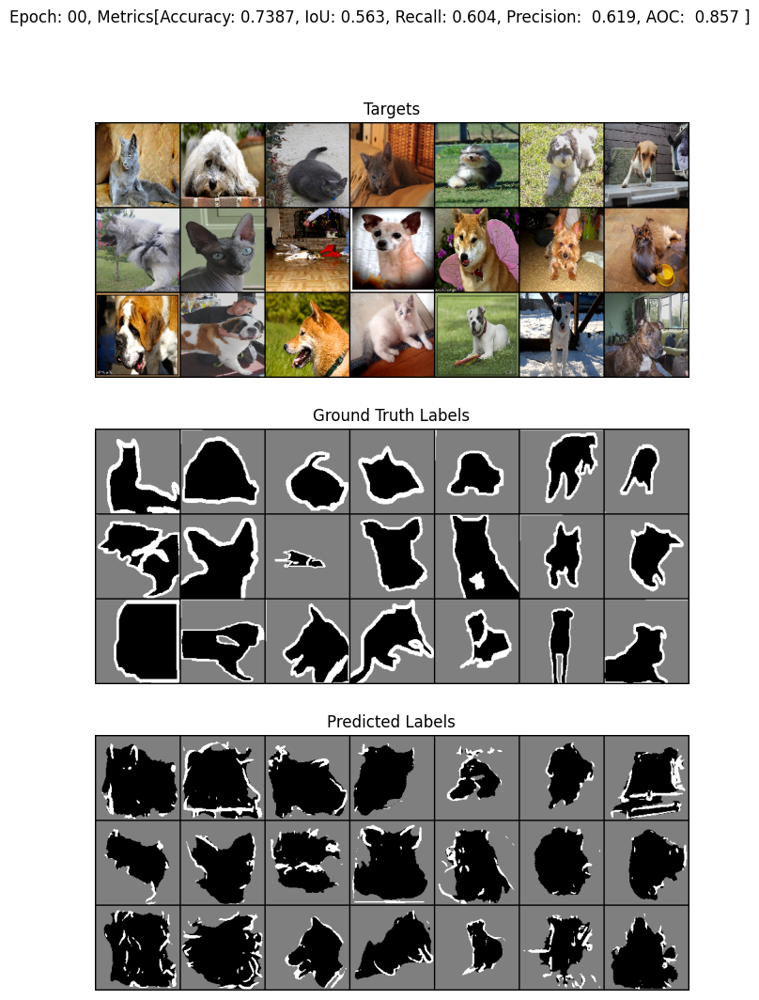

Train Epoch: 10	Train Loss: 0.302886	Validation Loss: 0.323219
Epoch: 10, Metrics[Accuracy: 0.8578, IoU: 0.666, Recall: 0.771, Precision:  0.794, AOC:  0.946 ]


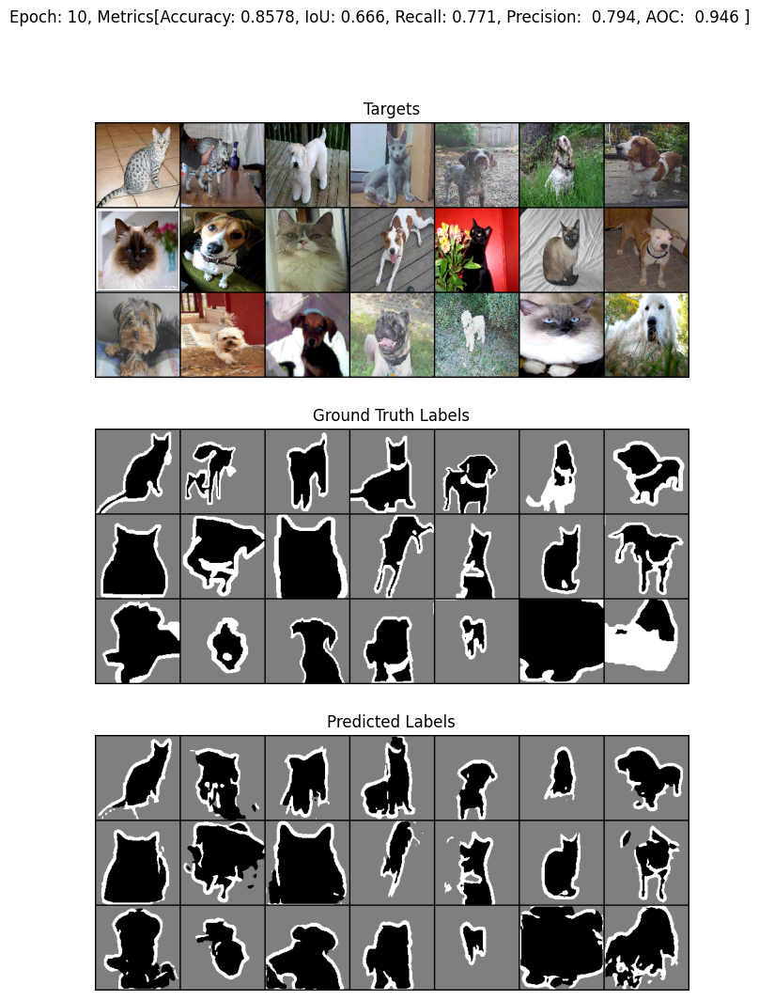

Train Epoch: 20	Train Loss: 0.252297	Validation Loss: 0.289842
Epoch: 20, Metrics[Accuracy: 0.9258, IoU: 0.789, Recall: 0.816, Precision:  0.864, AOC:  0.980 ]


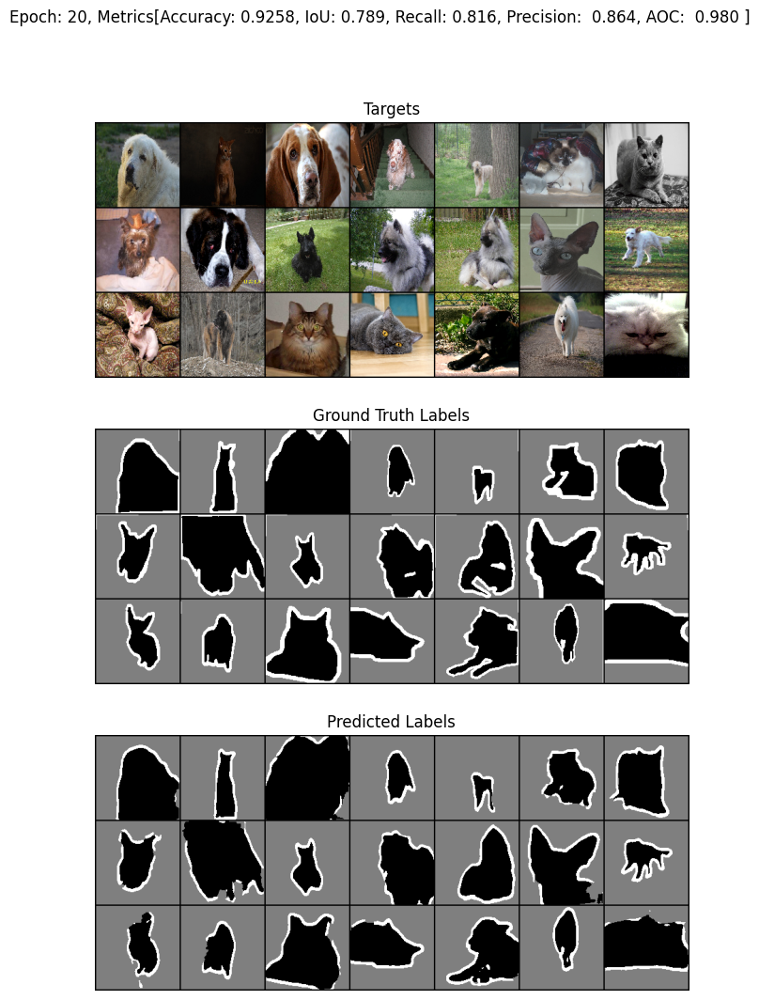

Train Epoch: 30	Train Loss: 0.212410	Validation Loss: 0.283738
Epoch: 30, Metrics[Accuracy: 0.9228, IoU: 0.764, Recall: 0.856, Precision:  0.864, AOC:  0.982 ]


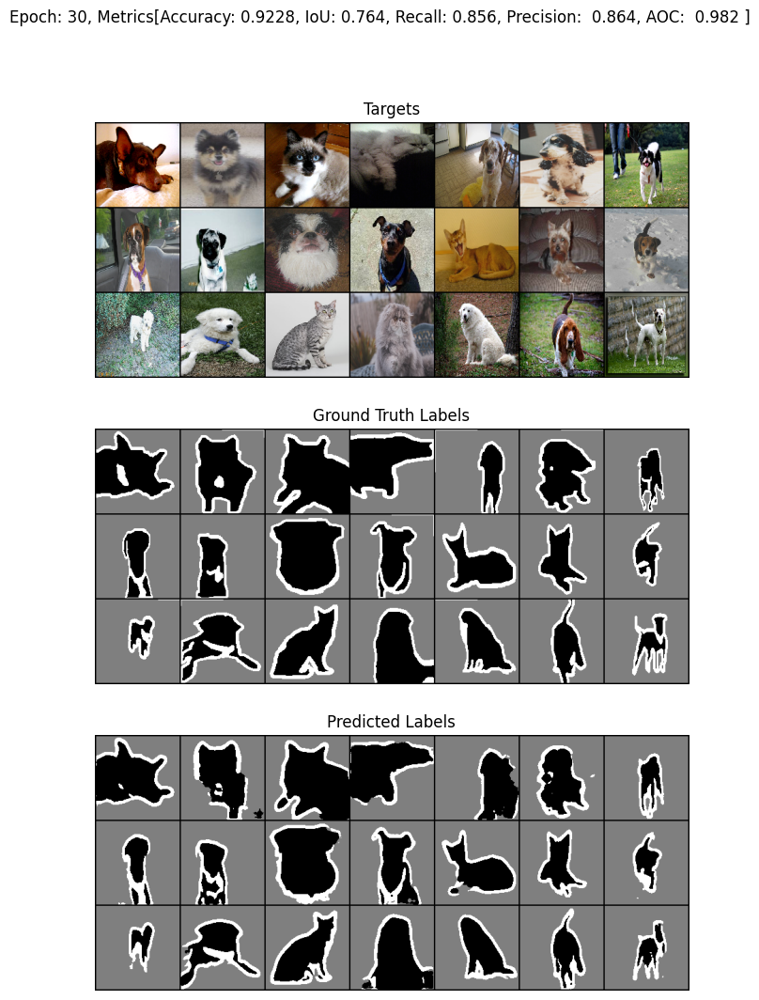

Train Epoch: 40	Train Loss: 0.187154	Validation Loss: 0.263332
Epoch: 40, Metrics[Accuracy: 0.9358, IoU: 0.810, Recall: 0.864, Precision:  0.876, AOC:  0.984 ]


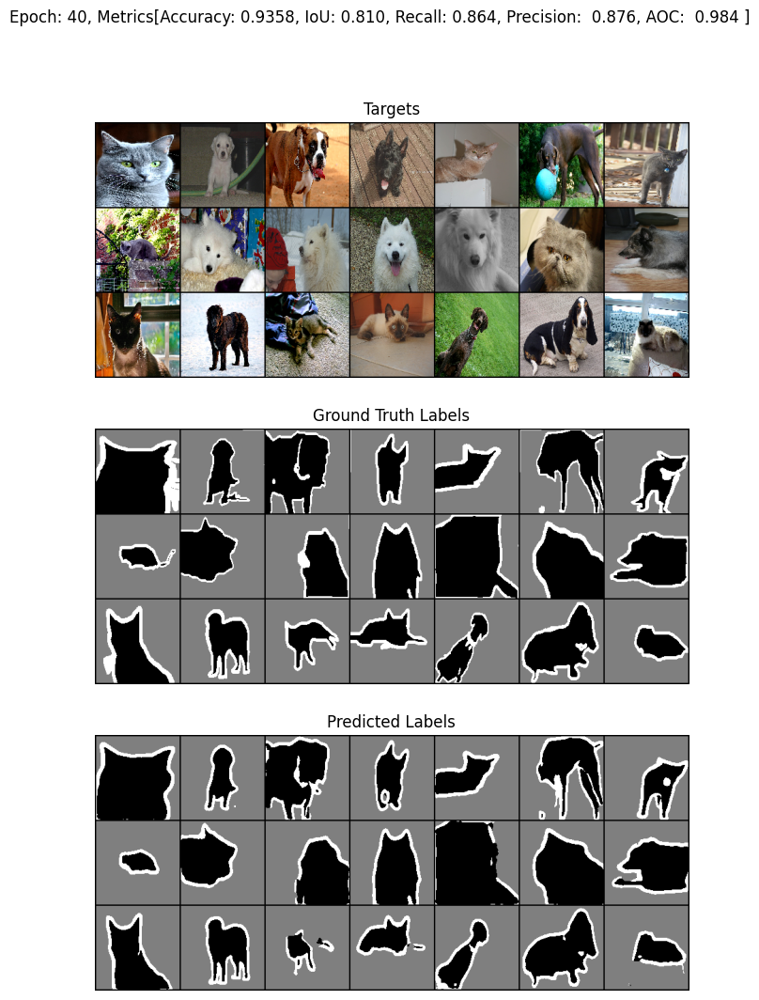

Stopping training early.


/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: No positive samples in targets, true positive value should be meaningless. Returning zero tensor in true positive score
  warnings.warn(*args, **kwargs)  # noqa: B028
/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: No negative samples in targets, false positive value should be meaningless. Returning zero tensor in false positive score
  warnings.warn(*args, **kwargs)  # noqa: B028



Test Metrics: 
 {'loss': 0.24666395937147176, 'accuracy': 0.90985125, 'recall': 0.84085065, 'iou': 0.76219684, 'precision': 0.8580022, 'aoc': 0.97347707}


In [10]:
# --- training arguments ---
parser = argparse.ArgumentParser(description='PyTorch RNN Time Series Classifier Example')
# --- training generals ---
parser.add_argument('--batch-size', type=int, default=48,
                    help='input batch size for training (default: 1)')
parser.add_argument('--test-batch-size', type=int, default=1,
                    help='input batch size for testing (default: 1)')
parser.add_argument('--epochs', type=int, default=50, metavar='N',
                    help='number of epochs to train (default: 500)')
parser.add_argument('--validation_percent', type=float, default=0.1,
                    help='Percentage of training data to use for validation (default: 0.1)')
parser.add_argument('--lr', type=float, default=0.001,
                    help='learning rate (default: 1.0)')

# --- paths ---
parser.add_argument('--dataset_path', type=str, default="./data", help='Path of the dataset')
parser.add_argument('--model_path', type=str, default="./",
                    help='Path of the folder in which to save/load the model')
parser.add_argument('--normalize_dataset', action='store_true', default=False,
                    help='Normalize the dataset along each dimension for each series.')

# --- early stopping ---
parser.add_argument('--use_early_stopping', action='store_false', default=True,
                    help='Disables early stopping.')
parser.add_argument('--es_patience', type=int, default=10,
                    help='The maximum number of epochs to wait for improvements before early stopping.')

# --- model parameters ---
parser.add_argument('--input_size', type=int, default=128, help='Input image resizing.')
parser.add_argument('--input_depth', type=int, default=3, help='The depth of channels.')
parser.add_argument('--output_size', type=int, default=3, help='The number of classes.')

# --- device parameters ---
parser.add_argument('--use_gpu', type=bool, default=True, help='use gpu')
parser.add_argument('--gpu', type=int, default=0, help='gpu')
parser.add_argument('--use_multi_gpu', action='store_true', help='use multiple gpus', default=False)
parser.add_argument('--devices', type=str, default='0', help='device ids of multile gpus')

# --- etc parameters ---
parser.add_argument('--dry-run', action='store_true', default=False,
                    help='quickly check a single pass')
parser.add_argument('--log-interval', type=int, default=10,
                    help='how many batches to wait before logging training status')
# --- model saving ---
parser.add_argument('--save-model', action='store_false', default=True,
                    help='For Saving the current Model')
args = parser.parse_args([])

# --- set up gpu ---
if args.use_gpu and args.use_multi_gpu:
    args.devices = args.devices.replace(' ', '')
    device_ids = args.devices.split(',')
    args.device_ids = [int(id_) for id_ in device_ids]
    args.gpu = args.device_ids[0]

# --- setup the trainer ---
trainer = Trainer(args)

# --- setup the model ---
network = UNet(args).to(trainer.device)


# --- put it on the gpu ---
if args.use_multi_gpu and args.use_gpu:
    network = torch.nn.DataParallel(network, device_ids=args.device_ids)

# --- optimizer ---
opt = torch.optim.Adam(network.parameters(), lr=args.lr, amsgrad=True)

# --- loss function ---
loss_function = torch.nn.CrossEntropyLoss()

# --- train the model ---
output_model, train_lss, valid_lss = trainer.train_model(network, opt, loss_function)

# --- test the model ---
test_metrics = trainer.model_test(network, loss_function)
print('\nTest Metrics: \n', test_metrics)

# --- save the final model ---
if args.save_model:
    torch.save({"model_state": output_model.state_dict(),
                "test_metrics": test_metrics,
                "training_losses": train_lss,
                "validation_losses": valid_lss}, trainer.final_model_path)


### **Analysis**

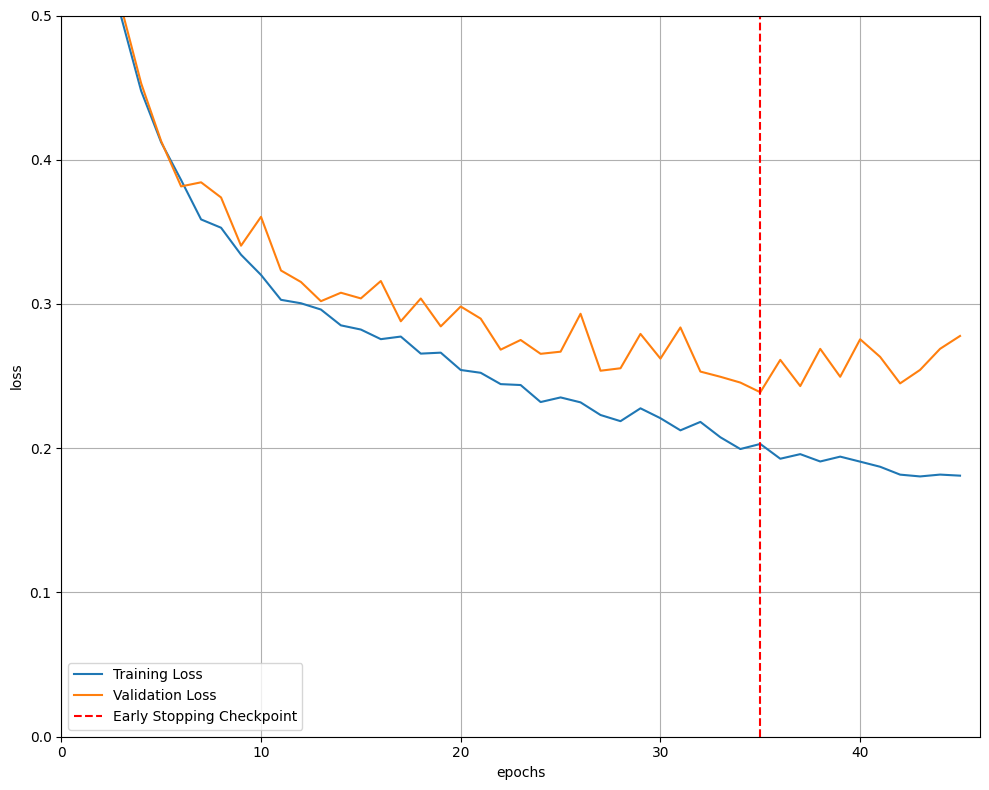

In [11]:

# --- visualize the loss as the network trained ---
fig = plt.figure(figsize=(10, 8))
plt.plot(range(1, len(train_lss) + 1), train_lss, label='Training Loss')
plt.plot(range(1, len(valid_lss) + 1), valid_lss, label='Validation Loss')

# --- find position of lowest validation loss ---
model_epoch = valid_lss.index(min(valid_lss))
training_loss = train_lss[model_epoch]
valid_loss = valid_lss[model_epoch]
plt.axvline(model_epoch + 1, linestyle='--', color='r', label='Early Stopping Checkpoint')

plt.xlabel('epochs')
plt.ylabel('loss')
plt.ylim(0, 0.5)  # consistent scale
plt.xlim(0, len(train_lss) + 1)  # consistent scale
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()
fig.savefig(args.model_path + 'loss_plot.png', bbox_inches='tight')
